## Sim Demo

### Imports

In [2]:
%load_ext autoreload
%autoreload 2

In [3]:
from env.imports import *

In [4]:
import importlib
import data

import models
import sim.sim
import sim.sim_utils
from sim.sim_utils import bytes2human, print_system_usage
from sim.sim import Simulation
from sim.sim_run import single_sim_run

importlib.reload(sim.sim)
importlib.reload(sim.sim_run) 

<module 'sim.sim_run' from '/scratch/asr655/neuroinformatics/GeneEx2Conn/sim/sim_run.py'>

#### Check job specs

In [5]:
print_system_usage()

total = psutil.disk_usage('/').total
print(bytes2human(total))

CPU Usage: 13.6%
RAM Usage: 5.7%
Available RAM: 1.4T
Total RAM: 1.5T
52.4G


In [6]:
print(os.environ.get("CUDA_VISIBLE_DEVICES"))

# Check available GPUs
print(f"Available GPUs: {torch.cuda.device_count()}")

for i in range(torch.cuda.device_count()):
    print(f"GPU {i}: {torch.cuda.get_device_name(i)} - Memory Allocated: {torch.cuda.memory_allocated(i)/1024**3:.2f} GB")


0
Available GPUs: 1
GPU 0: NVIDIA H100 80GB HBM3 - Memory Allocated: 0.00 GB


In [7]:
print("XGBoost version:", xgboost.__version__)
print("cupy version:", cp.__version__)

GPUtil.getAvailable()

# if a number is seen a GPU is available
GPUtil.getGPUs()

DEVICE_ID_LIST = GPUtil.getFirstAvailable()
DEVICE_ID = DEVICE_ID_LIST[0] # grab first element from list
if DEVICE_ID != None: 
    print('GPU found', DEVICE_ID)
    use_gpu = True

    GPUtil.showUtilization()

XGBoost version: 2.0.3
cupy version: 13.1.0
GPU found 0
| ID | GPU | MEM |
------------------
|  0 |  0% |  0% |


In [8]:
torch.cuda.is_available()

# Clear GPU memory
if torch.cuda.is_available():
    torch.cuda.empty_cache()

## Simulation tests <a id="sims"></a>

Spinning gene expression
Spin index for seed 42: 9
Mean error rank for spin index 9: 263.3333333333333
Number of components for 95% variance PCA: 27
Spinning gene expression
Spin index for seed 42: 9
Mean error rank for spin index 9: 263.3333333333333
Number of 1s: 36662, Number of 0s: 171274, Class balance (1s): 0.176
Number of 1s: 17738, Number of 0s: 190198, Class balance (1s): 0.085
X shape: (455, 7380)
X_pca shape: (455, 27)
Y_sc shape: (455, 455)
Y_sc_spectralL shape: (455, 455)
Y_sc_spectralA shape: (455, 456)
Y_fc shape: (455, 455)
Coordinates shape: (455, 3)
Y shape (455, 455)
Network coverage: 100.0% of regions
Network sizes: {'Vis': 61, 'SomMot': 77, 'DorsAttn': 46, 'SalVentAttn': 47, 'Limbic': 26, 'Cont': 52, 'Default': 91, 'Subcortical': 45, 'Cerebellum': 10}
feature_name: transcriptome, processing_type: None
features ['transcriptome']
Feature matrix, X, generated... expanding to pairwise dataset


ERROR: Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: Using wandb-core as the SDK backend. Please refer to https://wandb.me/wandb-core for more information.
wandb: Currently logged in as: asratzan (alexander-ratzan-new-york-university). Use `wandb login --relogin` to force relogin
wandb: WARNING Malformed sweep config detected! This may cause your sweep to behave in unexpected ways.
wandb: WARNING To avoid this, please fix the sweep config schema violations below:
wandb: WARNING   Violation 1. Additional properties are not allowed ('best_parameters' was unexpected)


Create sweep with ID: tng6qzdt
Sweep URL: https://wandb.ai/alexander-ratzan-new-york-university/gx2conn/sweeps/tng6qzdt
Initialized sweep with ID: tng6qzdt
Testing network: Limbic
Vis
SomMot
DorsAttn
SalVentAttn
Cont
Default
Subcortical
Cerebellum


wandb: Agent Starting Run: 0fehspye with config:
wandb: 	batch_size: 512
wandb: 	binarize: False
wandb: 	dropout_rate: 0.1
wandb: 	epochs: 125
wandb: 	hidden_dims: [512, 256, 128]
wandb: 	input_dim: 14760
wandb: 	learning_rate: 9e-05
wandb: 	weight_decay: 1e-05
ERROR: Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


Processing inner fold 0


/ext3/miniconda3/lib/python3.11/site-packages/torch/optim/lr_scheduler.py:60: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(


Number of learnable parameters in MLP: 7723777
Using device: cuda
GPU 0: NVIDIA H100 80GB HBM3 - Memory Allocated: 0.03 GB
Best val loss so far at epoch 1: 0.1644
Best val loss so far at epoch 3: 0.1513
Best val loss so far at epoch 5: 0.1383
Epoch 5/125, Train Loss: 0.0454, Val Loss: 0.1383, Time: 2.33s
Epoch 10/125, Train Loss: 0.0217, Val Loss: 0.2298, Time: 2.30s
Best val loss so far at epoch 13: 0.0940
Epoch 15/125, Train Loss: 0.0140, Val Loss: 0.0999, Time: 2.28s
Epoch 20/125, Train Loss: 0.0103, Val Loss: 0.1879, Time: 2.65s
Epoch 25/125, Train Loss: 0.0086, Val Loss: 0.1223, Time: 2.27s
Epoch 30/125, Train Loss: 0.0074, Val Loss: 0.1456, Time: 2.63s

LR REDUCED: 0.000090 → 0.000027 at Val Loss: 0.170229
Epoch 35/125, Train Loss: 0.0051, Val Loss: 0.1426, Time: 2.35s
Epoch 40/125, Train Loss: 0.0046, Val Loss: 0.1561, Time: 2.35s
Epoch 45/125, Train Loss: 0.0044, Val Loss: 0.1665, Time: 2.64s
Epoch 50/125, Train Loss: 0.0041, Val Loss: 0.1659, Time: 2.27s
Epoch 55/125, Train Lo

fold0_epoch,▁▁▁▁▁▂▂▂▂▃▃▃▃▄▄▄▄▄▄▄▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇▇████
fold0_train_loss,█▆▃▃▃▂▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
fold0_val_loss,▂▂▂▂▃▅▄█▁▁▁▂▃▂▃▂▁▃▂▂▃▃▂▂▂▃▂▂▂▂▂▃▂▂▃▃▂▂▂▂
inner_fold,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
mean_train_loss,▁
mean_train_pearson,▁
mean_val_loss,▁
mean_val_pearson,▁
fold0_epoch,62
fold0_train_loss,0.00324
fold0_val_loss,0.16468


wandb: Agent Starting Run: htl7mi0l with config:
wandb: 	batch_size: 512
wandb: 	binarize: False
wandb: 	dropout_rate: 0
wandb: 	epochs: 100
wandb: 	hidden_dims: [1024, 512, 256, 128]
wandb: 	input_dim: 14760
wandb: 	learning_rate: 9e-05
wandb: 	weight_decay: 0
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


Processing inner fold 0


/ext3/miniconda3/lib/python3.11/site-packages/torch/optim/lr_scheduler.py:60: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(


Number of learnable parameters in MLP: 15808257
Using device: cuda
GPU 0: NVIDIA H100 80GB HBM3 - Memory Allocated: 0.12 GB
Best val loss so far at epoch 1: 0.1803
Best val loss so far at epoch 2: 0.1290
Best val loss so far at epoch 3: 0.1014
Epoch 5/100, Train Loss: 0.0197, Val Loss: 0.2427, Time: 2.46s
Epoch 10/100, Train Loss: 0.0111, Val Loss: 0.1190, Time: 2.71s
Epoch 15/100, Train Loss: 0.0076, Val Loss: 0.1419, Time: 2.72s
Epoch 20/100, Train Loss: 0.0059, Val Loss: 0.2118, Time: 2.75s

LR REDUCED: 0.000090 → 0.000027 at Val Loss: 0.116203
Epoch 25/100, Train Loss: 0.0035, Val Loss: 0.1440, Time: 2.54s
Epoch 30/100, Train Loss: 0.0030, Val Loss: 0.1231, Time: 2.79s
Epoch 35/100, Train Loss: 0.0027, Val Loss: 0.1527, Time: 2.43s
Epoch 40/100, Train Loss: 0.0025, Val Loss: 0.1311, Time: 2.43s
Epoch 45/100, Train Loss: 0.0022, Val Loss: 0.1432, Time: 2.44s

LR REDUCED: 0.000027 → 0.000008 at Val Loss: 0.151381
Epoch 50/100, Train Loss: 0.0016, Val Loss: 0.1406, Time: 2.87s

Early 

fold0_epoch,▁▁▁▁▂▂▂▂▂▂▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇███
fold0_train_loss,█▆▄▄▃▃▃▂▂▂▂▂▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
fold0_val_loss,▅▂▁▃█▅▃▂▂▂▆▃▆▅▃▅▄▂▃▂▃▃▂▃▄▄▃▃▃▃▃▄▃▄▃▃▃▃▃▂
inner_fold,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
mean_train_loss,▁
mean_train_pearson,▁
mean_val_loss,▁
mean_val_pearson,▁
fold0_epoch,52
fold0_train_loss,0.00154
fold0_val_loss,0.12976


wandb: Agent Starting Run: ud0c973a with config:
wandb: 	batch_size: 512
wandb: 	binarize: False
wandb: 	dropout_rate: 0
wandb: 	epochs: 100
wandb: 	hidden_dims: [256, 128]
wandb: 	input_dim: 14760
wandb: 	learning_rate: 9e-05
wandb: 	weight_decay: 1e-05
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


Processing inner fold 0


/ext3/miniconda3/lib/python3.11/site-packages/torch/optim/lr_scheduler.py:60: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(


Number of learnable parameters in MLP: 3812609
Using device: cuda
GPU 0: NVIDIA H100 80GB HBM3 - Memory Allocated: 0.08 GB
Best val loss so far at epoch 1: 0.1663
Best val loss so far at epoch 2: 0.1604
Best val loss so far at epoch 3: 0.0739
Epoch 5/100, Train Loss: 0.0229, Val Loss: 0.2075, Time: 2.26s
Epoch 10/100, Train Loss: 0.0154, Val Loss: 0.1792, Time: 2.26s
Epoch 15/100, Train Loss: 0.0113, Val Loss: 0.1574, Time: 2.27s
Epoch 20/100, Train Loss: 0.0088, Val Loss: 0.1770, Time: 2.69s

LR REDUCED: 0.000090 → 0.000027 at Val Loss: 0.204798
Epoch 25/100, Train Loss: 0.0058, Val Loss: 0.1741, Time: 2.41s
Epoch 30/100, Train Loss: 0.0053, Val Loss: 0.1947, Time: 2.70s
Epoch 35/100, Train Loss: 0.0048, Val Loss: 0.1956, Time: 2.55s
Epoch 40/100, Train Loss: 0.0045, Val Loss: 0.1648, Time: 2.26s
Epoch 45/100, Train Loss: 0.0043, Val Loss: 0.1726, Time: 2.40s

LR REDUCED: 0.000027 → 0.000008 at Val Loss: 0.136424
Epoch 50/100, Train Loss: 0.0034, Val Loss: 0.1494, Time: 2.39s

Early s

fold0_epoch,▁▁▁▁▂▂▂▂▂▂▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇▇███
fold0_train_loss,█▆▅▅▄▄▃▃▃▃▂▂▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
fold0_val_loss,▅▅▁▆▆▅▄▃█▃▄▆▅▃▅▅▂▆▅▅▄▅▅▅▄▅▅▃▄▅▅▅▆▅▄▅▅▄▅▄
inner_fold,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
mean_train_loss,▁
mean_train_pearson,▁
mean_val_loss,▁
mean_val_pearson,▁
fold0_epoch,52
fold0_train_loss,0.00329
fold0_val_loss,0.1565


wandb: Sorting runs by +summary_metrics.mean_val_loss
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.


BEST CONFIG {'epochs': 100, 'binarize': False, 'input_dim': 14760, 'batch_size': 512, 'hidden_dims': [1024, 512, 256, 128], 'dropout_rate': 0, 'weight_decay': 0, 'learning_rate': 9e-05}
Number of learnable parameters in MLP: 15808257


Using device: cuda
GPU 0: NVIDIA H100 80GB HBM3 - Memory Allocated: 0.12 GB
Best val loss so far at epoch 1: 0.0254
Best val loss so far at epoch 3: 0.0188
Epoch 5/100, Train Loss: 0.0191, Val Loss: 0.0293, Time: 2.97s
Epoch 10/100, Train Loss: 0.0112, Val Loss: 0.0335, Time: 3.23s
Epoch 15/100, Train Loss: 0.0073, Val Loss: 0.0549, Time: 3.50s
Epoch 20/100, Train Loss: 0.0054, Val Loss: 0.0383, Time: 3.08s

LR REDUCED: 0.000090 → 0.000027 at Val Loss: 0.032697
Epoch 25/100, Train Loss: 0.0031, Val Loss: 0.0328, Time: 3.11s
Epoch 30/100, Train Loss: 0.0026, Val Loss: 0.0350, Time: 3.46s
Epoch 35/100, Train Loss: 0.0023, Val Loss: 0.0330, Time: 3.15s
Epoch 40/100, Train Loss: 0.0020, Val Loss: 0.0363, Time: 2.98s
Epoch 45/100, Train Loss: 0.0018, Val Loss: 0.0390, Time: 3.57s

LR REDUCED: 0.000027 → 0.000008 at Val Loss: 0.038940
Epoch 50/100, Train Loss: 0.0013, Val Loss: 0.0361, Time: 3.17s

Early stopping triggered at epoch 53. Restoring best model with Val Loss: 0.0188, Pearson Corr

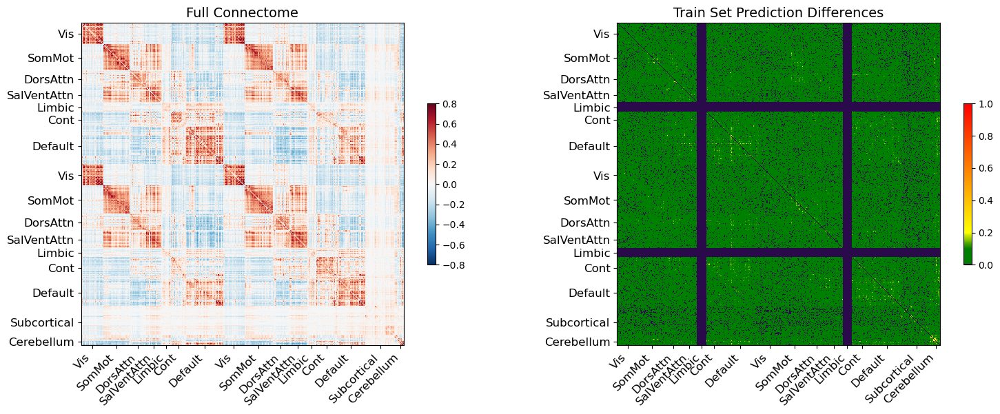

<Figure size 640x480 with 0 Axes>

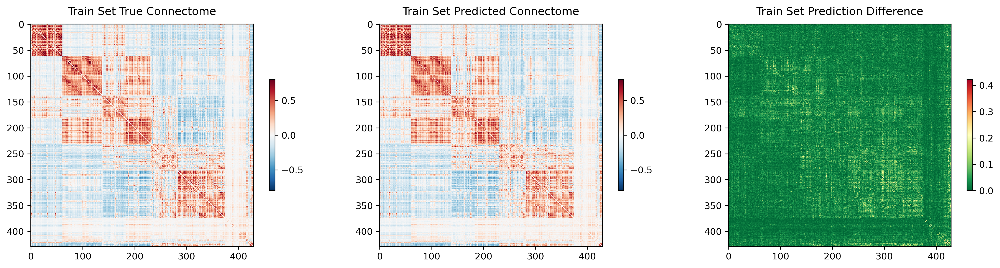

<Figure size 640x480 with 0 Axes>

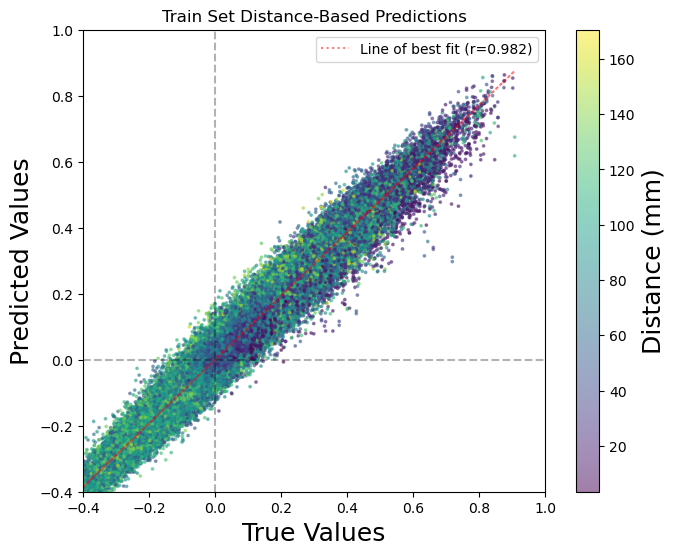

Running test evaluation...

=== TEST EVALUATION ===
Evaluating 26 regions, 650 connections


<Figure size 640x480 with 0 Axes>

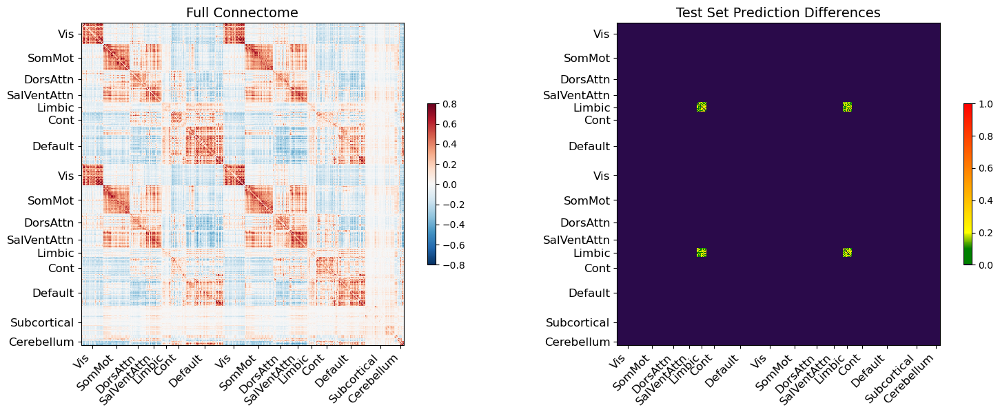

<Figure size 640x480 with 0 Axes>

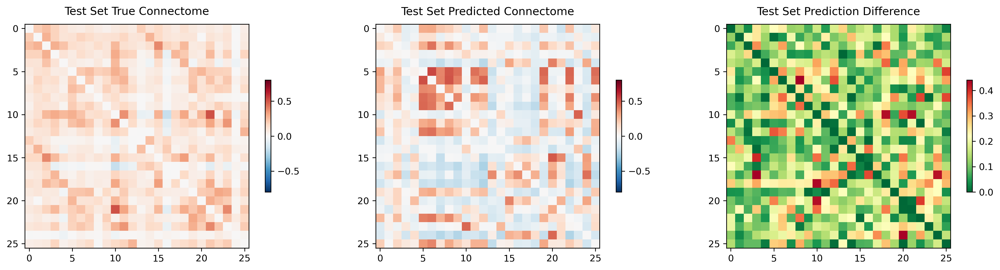

<Figure size 640x480 with 0 Axes>

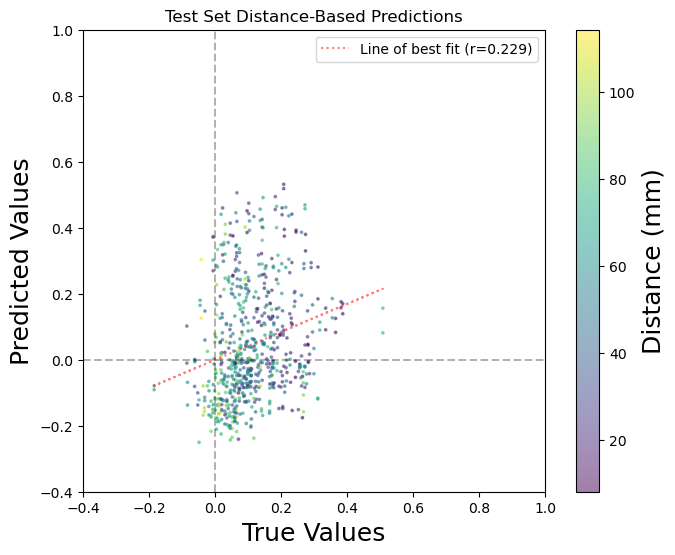

TRAIN METRICS
GLOBAL: mse=0.001337, mae=0.027100, r2=0.9634, pearson_r=0.9816, spearman_r=0.9770, geodesic_distance=19.8811
DISTANCE-BASED: short=0.9834, mid=0.9793, long=0.9758
HEMISPHERIC: left=0.9825, right=0.9843, inter=0.9799
CONNECTION STRENGTH: neg=0.6886, weak=0.9667, pos=0.8846
NETWORK CORRELATIONS:
  NETWORK      INTRA      INTER
  ------------------------------
  Cont          0.9831    0.9863
  Default       0.9875    0.9863
  SalVentAttn    0.9872    0.9868
  DorsAttn      0.9886    0.9891
  SomMot        0.9862    0.9875
  Vis           0.9906    0.9896
  Subcortical    0.9794    0.9872
  Cerebellum    0.9558    0.9852

TEST METRICS
GLOBAL: mse=0.035389, mae=0.161140, r2=-3.0584, pearson_r=0.2288, spearman_r=0.2774, geodesic_distance=6.7743
DISTANCE-BASED: short=0.1743, mid=0.2501
HEMISPHERIC: left=0.0752, right=0.1356, inter=0.2515
CONNECTION STRENGTH: weak=0.2237
NETWORK CORRELATIONS:
  NETWORK      INTRA      INTER
  ------------------------------
  Limbic        0.210

best_val_loss,▁
test_mse_loss,▁▃▂▄▃▃▃▆▄▄█▆▃▂▆▂▂▅▃▃▃▃▃▄▄▄▃▃▃▃▆▃▄▅▄▃▄▄▄▄
train_mse_loss,█▅▄▄▄▃▃▃▂▂▂▂▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
best_val_loss,0.12976
test_mse_loss,0.03717
train_mse_loss,0.00128


Final evaluation metrics logged successfully.


wandb: WARNING Malformed sweep config detected! This may cause your sweep to behave in unexpected ways.
wandb: WARNING To avoid this, please fix the sweep config schema violations below:
wandb: WARNING   Violation 1. Additional properties are not allowed ('best_parameters' was unexpected)


Create sweep with ID: ee1ppm3a
Sweep URL: https://wandb.ai/alexander-ratzan-new-york-university/gx2conn/sweeps/ee1ppm3a
Initialized sweep with ID: ee1ppm3a
Testing network: Cont
Vis
SomMot
DorsAttn
SalVentAttn
Limbic
Default
Subcortical
Cerebellum


wandb: Agent Starting Run: e6z6lt3l with config:
wandb: 	batch_size: 512
wandb: 	binarize: False
wandb: 	dropout_rate: 0.3
wandb: 	epochs: 75
wandb: 	hidden_dims: [512, 256, 128]
wandb: 	input_dim: 14760
wandb: 	learning_rate: 9e-05
wandb: 	weight_decay: 0.0001
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


Processing inner fold 0


/ext3/miniconda3/lib/python3.11/site-packages/torch/optim/lr_scheduler.py:60: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(


Number of learnable parameters in MLP: 7723777
Using device: cuda
GPU 0: NVIDIA H100 80GB HBM3 - Memory Allocated: 0.33 GB
Best val loss so far at epoch 1: 0.1785
Epoch 5/75, Train Loss: 0.0537, Val Loss: 0.1982, Time: 2.00s
Best val loss so far at epoch 8: 0.1687
Best val loss so far at epoch 9: 0.1428
Epoch 10/75, Train Loss: 0.0255, Val Loss: 0.1800, Time: 4.00s
Best val loss so far at epoch 13: 0.0849
Epoch 15/75, Train Loss: 0.0195, Val Loss: 0.2116, Time: 1.97s
Epoch 20/75, Train Loss: 0.0161, Val Loss: 0.1877, Time: 3.58s
Epoch 25/75, Train Loss: 0.0132, Val Loss: 0.1940, Time: 2.34s
Epoch 30/75, Train Loss: 0.0112, Val Loss: 0.2470, Time: 2.38s

LR REDUCED: 0.000090 → 0.000027 at Val Loss: 0.180177
Epoch 35/75, Train Loss: 0.0086, Val Loss: 0.1660, Time: 2.07s
Epoch 40/75, Train Loss: 0.0078, Val Loss: 0.1903, Time: 2.37s
Epoch 45/75, Train Loss: 0.0074, Val Loss: 0.1986, Time: 2.27s
Epoch 50/75, Train Loss: 0.0070, Val Loss: 0.1743, Time: 2.01s
Epoch 55/75, Train Loss: 0.0065,

fold0_epoch,▁▁▁▁▂▂▂▂▂▂▃▃▃▃▃▄▄▄▄▄▄▅▅▅▅▅▅▅▆▆▆▇▇▇▇▇▇███
fold0_train_loss,█▅▄▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
fold0_val_loss,▃▄▄▄▄▂▁▄▄▆▄▆▃▃▃▃▂▂▃▆▅█▃▃▃▂▄▂▄▄▄▃▃▃▂▃▂▂▃▂
inner_fold,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
mean_train_loss,▁
mean_train_pearson,▁
mean_val_loss,▁
mean_val_pearson,▁
fold0_epoch,62
fold0_train_loss,0.0058
fold0_val_loss,0.18863


wandb: Agent Starting Run: 49z2fz76 with config:
wandb: 	batch_size: 512
wandb: 	binarize: False
wandb: 	dropout_rate: 0.3
wandb: 	epochs: 75
wandb: 	hidden_dims: [512, 256, 128]
wandb: 	input_dim: 14760
wandb: 	learning_rate: 9e-05
wandb: 	weight_decay: 1e-05
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


Processing inner fold 0


/ext3/miniconda3/lib/python3.11/site-packages/torch/optim/lr_scheduler.py:60: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(


Number of learnable parameters in MLP: 7723777
Using device: cuda
GPU 0: NVIDIA H100 80GB HBM3 - Memory Allocated: 0.36 GB
Best val loss so far at epoch 1: 0.1981
Best val loss so far at epoch 5: 0.1940
Epoch 5/75, Train Loss: 0.0471, Val Loss: 0.1940, Time: 2.04s
Best val loss so far at epoch 7: 0.1726
Epoch 10/75, Train Loss: 0.0237, Val Loss: 0.2228, Time: 2.04s
Best val loss so far at epoch 14: 0.1684
Epoch 15/75, Train Loss: 0.0187, Val Loss: 0.2154, Time: 2.00s
Best val loss so far at epoch 16: 0.1336
Epoch 20/75, Train Loss: 0.0155, Val Loss: 0.1799, Time: 2.14s
Epoch 25/75, Train Loss: 0.0129, Val Loss: 0.2191, Time: 2.42s
Best val loss so far at epoch 28: 0.1114
Epoch 30/75, Train Loss: 0.0111, Val Loss: 0.1556, Time: 2.16s
Epoch 35/75, Train Loss: 0.0097, Val Loss: 0.1631, Time: 2.34s
Epoch 40/75, Train Loss: 0.0086, Val Loss: 0.1839, Time: 2.03s
Epoch 45/75, Train Loss: 0.0080, Val Loss: 0.1659, Time: 2.12s

LR REDUCED: 0.000090 → 0.000027 at Val Loss: 0.171740
Epoch 50/75, 

fold0_epoch,▁▁▁▁▁▂▂▂▂▂▂▂▃▃▃▃▃▃▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇█████
fold0_train_loss,█▃▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
fold0_val_loss,▅▄▆▅▄▆▆▆▅▄▅▄▁▃▅▄▃▆▃▃▄█▅▅▅▄▃▄▄▄▄▄▄▄▄▃▄▄▄▄
inner_fold,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
mean_train_loss,▁
mean_train_pearson,▁
mean_val_loss,▁
mean_val_pearson,▁
fold0_epoch,74
fold0_train_loss,0.00479
fold0_val_loss,0.18088


wandb: Agent Starting Run: y483ihrh with config:
wandb: 	batch_size: 512
wandb: 	binarize: False
wandb: 	dropout_rate: 0.3
wandb: 	epochs: 125
wandb: 	hidden_dims: [1024, 512, 256, 128]
wandb: 	input_dim: 14760
wandb: 	learning_rate: 9e-05
wandb: 	weight_decay: 1e-05
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


Processing inner fold 0


/ext3/miniconda3/lib/python3.11/site-packages/torch/optim/lr_scheduler.py:60: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(


Number of learnable parameters in MLP: 15808257
Using device: cuda
GPU 0: NVIDIA H100 80GB HBM3 - Memory Allocated: 0.39 GB
Best val loss so far at epoch 1: 0.1866
Epoch 5/125, Train Loss: 0.0488, Val Loss: 0.1988, Time: 2.18s
Best val loss so far at epoch 6: 0.1861
Epoch 10/125, Train Loss: 0.0244, Val Loss: 0.2000, Time: 2.12s
Epoch 15/125, Train Loss: 0.0185, Val Loss: 0.1953, Time: 2.41s
Epoch 20/125, Train Loss: 0.0149, Val Loss: 0.1864, Time: 2.11s
Best val loss so far at epoch 21: 0.1728
Epoch 25/125, Train Loss: 0.0121, Val Loss: 0.2169, Time: 2.47s
Epoch 30/125, Train Loss: 0.0101, Val Loss: 0.2202, Time: 2.43s
Epoch 35/125, Train Loss: 0.0088, Val Loss: 0.1954, Time: 2.23s
Best val loss so far at epoch 37: 0.1714
Best val loss so far at epoch 39: 0.1486
Epoch 40/125, Train Loss: 0.0078, Val Loss: 0.2010, Time: 2.16s
Best val loss so far at epoch 41: 0.1296
Epoch 45/125, Train Loss: 0.0070, Val Loss: 0.1399, Time: 2.47s
Epoch 50/125, Train Loss: 0.0066, Val Loss: 0.1885, Time:

fold0_epoch,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▄▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇████
fold0_train_loss,█▆▅▄▄▃▃▃▃▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
fold0_val_loss,▄▄▄▄▄▄▆▆▄▅▃▆▄▄▅▂▂▂▃▃▅▄▁▃█▂▅▄▄▄▄▃▃▄▅▄▃▄▄▄
inner_fold,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
mean_train_loss,▁
mean_train_pearson,▁
mean_val_loss,▁
mean_val_pearson,▁
fold0_epoch,109
fold0_train_loss,0.0028
fold0_val_loss,0.18664


wandb: Sorting runs by +summary_metrics.mean_val_loss
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.


BEST CONFIG {'epochs': 75, 'binarize': False, 'input_dim': 14760, 'batch_size': 512, 'hidden_dims': [512, 256, 128], 'dropout_rate': 0.3, 'weight_decay': 1e-05, 'learning_rate': 9e-05}
Number of learnable parameters in MLP: 7723777


Using device: cuda
GPU 0: NVIDIA H100 80GB HBM3 - Memory Allocated: 0.36 GB
Best val loss so far at epoch 1: 0.0551
Best val loss so far at epoch 4: 0.0546
Epoch 5/75, Train Loss: 0.0346, Val Loss: 0.0674, Time: 2.70s
Best val loss so far at epoch 9: 0.0542
Epoch 10/75, Train Loss: 0.0212, Val Loss: 0.0805, Time: 2.73s
Epoch 15/75, Train Loss: 0.0154, Val Loss: 0.0648, Time: 2.71s
Epoch 20/75, Train Loss: 0.0125, Val Loss: 0.0674, Time: 2.88s

LR REDUCED: 0.000090 → 0.000027 at Val Loss: 0.100782
Epoch 25/75, Train Loss: 0.0095, Val Loss: 0.0770, Time: 2.68s
Epoch 30/75, Train Loss: 0.0086, Val Loss: 0.0797, Time: 2.58s
Epoch 35/75, Train Loss: 0.0080, Val Loss: 0.0820, Time: 3.06s
Epoch 40/75, Train Loss: 0.0073, Val Loss: 0.0810, Time: 2.69s

LR REDUCED: 0.000027 → 0.000008 at Val Loss: 0.087773
Epoch 45/75, Train Loss: 0.0063, Val Loss: 0.0795, Time: 2.72s
Epoch 50/75, Train Loss: 0.0060, Val Loss: 0.0799, Time: 2.90s
Epoch 55/75, Train Loss: 0.0058, Val Loss: 0.0806, Time: 2.58s

E

<Figure size 640x480 with 0 Axes>

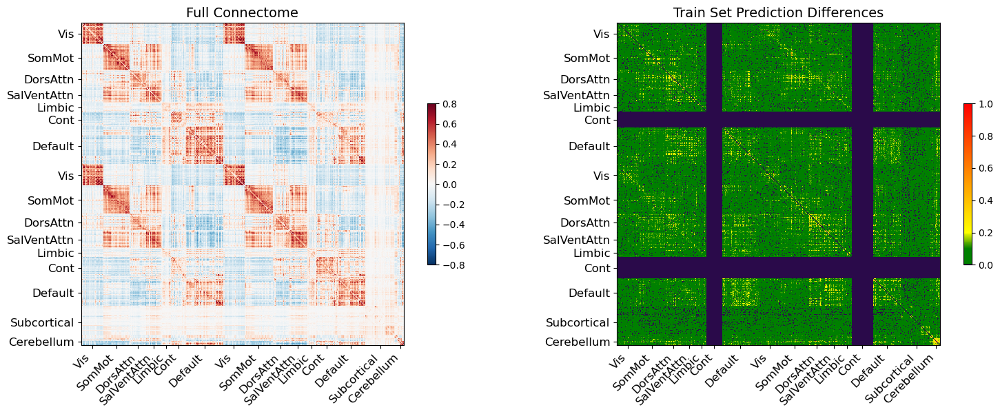

<Figure size 640x480 with 0 Axes>

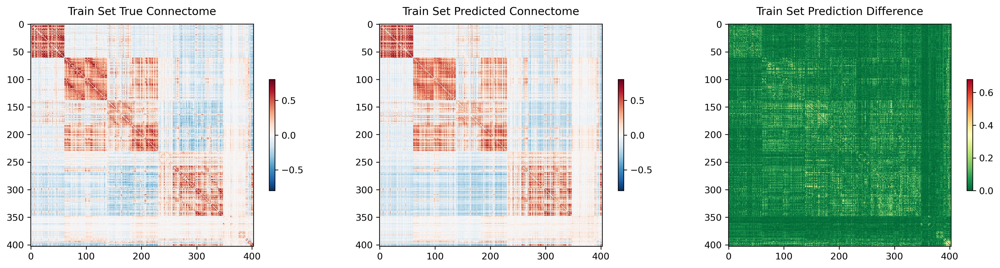

<Figure size 640x480 with 0 Axes>

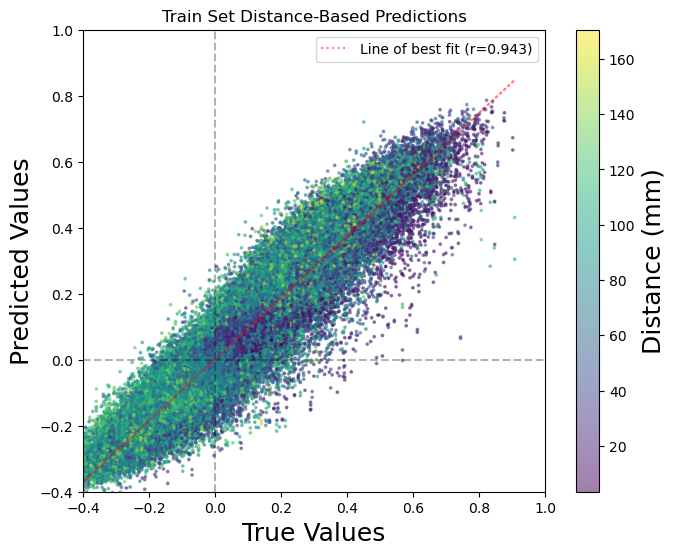

Running test evaluation...

=== TEST EVALUATION ===
Evaluating 52 regions, 2652 connections


<Figure size 640x480 with 0 Axes>

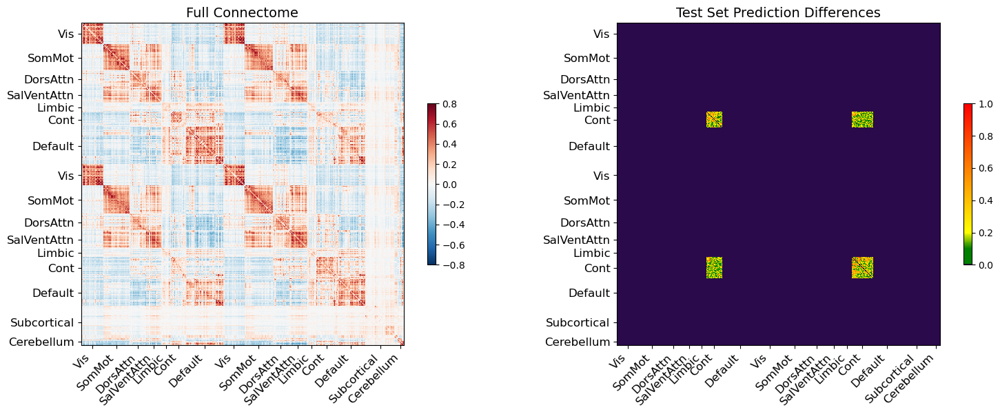

<Figure size 640x480 with 0 Axes>

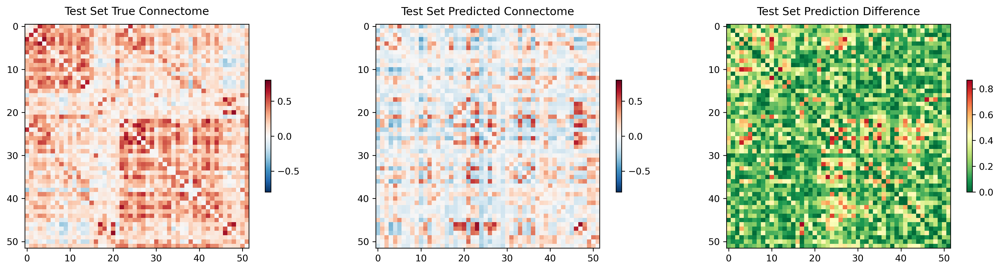

<Figure size 640x480 with 0 Axes>

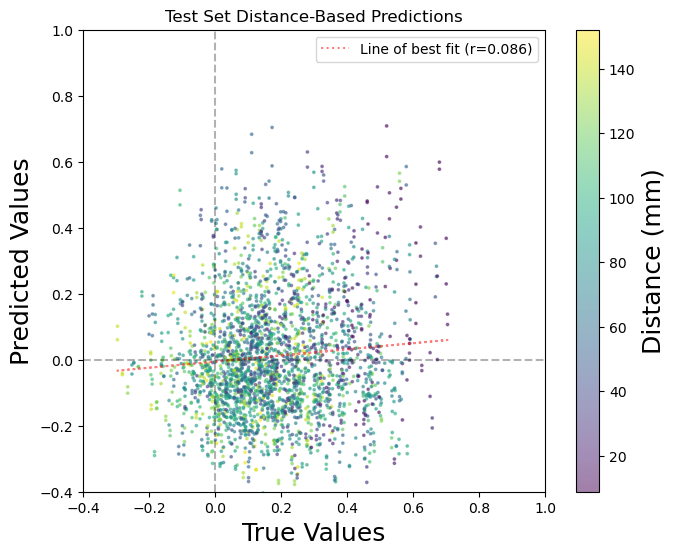

TRAIN METRICS
GLOBAL: mse=0.004011, mae=0.045584, r2=0.8870, pearson_r=0.9429, spearman_r=0.9299, geodesic_distance=19.1213
DISTANCE-BASED: short=0.9425, mid=0.9383, long=0.9357
HEMISPHERIC: left=0.9480, right=0.9474, inter=0.9490
CONNECTION STRENGTH: neg=0.4467, weak=0.9003, pos=0.6664
NETWORK CORRELATIONS:
  NETWORK      INTRA      INTER
  ------------------------------
  Default       0.9484    0.9542
  SalVentAttn    0.9469    0.9573
  Limbic        0.9547    0.9540
  DorsAttn      0.9532    0.9572
  SomMot        0.9490    0.9541
  Vis           0.9646    0.9625
  Subcortical    0.9576    0.9498
  Cerebellum    0.9404    0.9579

TEST METRICS
GLOBAL: mse=0.086505, mae=0.236713, r2=-1.9310, pearson_r=0.0864, spearman_r=0.0595, geodesic_distance=9.0644
DISTANCE-BASED: short=0.1342, mid=0.0101, long=0.0622
HEMISPHERIC: left=0.1356, right=0.0650, inter=0.0614
CONNECTION STRENGTH: weak=0.0426, pos=0.1293
NETWORK CORRELATIONS:
  NETWORK      INTRA      INTER
  ---------------------------

best_val_loss,▁
test_mse_loss,▁▁▁▃▂▅▄█▂▃▃▃█▄▄▄▄▄▄▅▅▅▄▅▅▅▄▅▅▄▅▅▅▅▅▄▅▄▅▅
train_mse_loss,█▄▃▃▃▂▂▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
best_val_loss,0.18088
test_mse_loss,0.08455
train_mse_loss,0.00569


Final evaluation metrics logged successfully.


wandb: WARNING Malformed sweep config detected! This may cause your sweep to behave in unexpected ways.
wandb: WARNING To avoid this, please fix the sweep config schema violations below:
wandb: WARNING   Violation 1. Additional properties are not allowed ('best_parameters' was unexpected)


Create sweep with ID: unqi3ymh
Sweep URL: https://wandb.ai/alexander-ratzan-new-york-university/gx2conn/sweeps/unqi3ymh
Initialized sweep with ID: unqi3ymh
Testing network: Default
Vis
SomMot
DorsAttn
SalVentAttn
Limbic
Cont
Subcortical
Cerebellum


wandb: Agent Starting Run: 6c7ja5ow with config:
wandb: 	batch_size: 512
wandb: 	binarize: False
wandb: 	dropout_rate: 0.1
wandb: 	epochs: 125
wandb: 	hidden_dims: [1024, 512, 256, 128]
wandb: 	input_dim: 14760
wandb: 	learning_rate: 9e-05
wandb: 	weight_decay: 0.0001
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


Processing inner fold 0


/ext3/miniconda3/lib/python3.11/site-packages/torch/optim/lr_scheduler.py:60: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(


Number of learnable parameters in MLP: 15808257
Using device: cuda
GPU 0: NVIDIA H100 80GB HBM3 - Memory Allocated: 0.27 GB
Best val loss so far at epoch 1: 0.1804
Best val loss so far at epoch 4: 0.1558
Epoch 5/125, Train Loss: 0.0357, Val Loss: 0.1666, Time: 2.00s
Best val loss so far at epoch 7: 0.1097
Epoch 10/125, Train Loss: 0.0190, Val Loss: 0.1326, Time: 1.66s
Epoch 15/125, Train Loss: 0.0117, Val Loss: 0.1833, Time: 1.69s
Epoch 20/125, Train Loss: 0.0083, Val Loss: 0.1887, Time: 1.74s
Epoch 25/125, Train Loss: 0.0067, Val Loss: 0.1574, Time: 1.67s

LR REDUCED: 0.000090 → 0.000027 at Val Loss: 0.113143
Epoch 30/125, Train Loss: 0.0046, Val Loss: 0.1434, Time: 1.73s
Epoch 35/125, Train Loss: 0.0042, Val Loss: 0.1365, Time: 1.67s
Epoch 40/125, Train Loss: 0.0039, Val Loss: 0.1422, Time: 1.75s
Epoch 45/125, Train Loss: 0.0035, Val Loss: 0.1365, Time: 1.70s

LR REDUCED: 0.000027 → 0.000008 at Val Loss: 0.152323
Epoch 50/125, Train Loss: 0.0033, Val Loss: 0.1523, Time: 1.68s
Epoch 5

fold0_epoch,▁▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▅▅▅▅▅▅▅▅▆▆▇▇▇▇▇▇▇███
fold0_train_loss,█▇▆▅▅▄▃▃▃▃▂▂▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
fold0_val_loss,▆█▇▄▅▂▃▅▃▄▆▄▆▄▇▄█▁▃▃▃▃▂▃▂▅▃▂▃▂▅▄▄▂▄▃▃▂▃▃
inner_fold,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
mean_train_loss,▁
mean_train_pearson,▁
mean_val_loss,▁
mean_val_pearson,▁
fold0_epoch,56
fold0_train_loss,0.00267
fold0_val_loss,0.13306


wandb: Agent Starting Run: 2a1y6h6o with config:
wandb: 	batch_size: 512
wandb: 	binarize: False
wandb: 	dropout_rate: 0
wandb: 	epochs: 100
wandb: 	hidden_dims: [256, 128]
wandb: 	input_dim: 14760
wandb: 	learning_rate: 9e-05
wandb: 	weight_decay: 0.0001
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


Processing inner fold 0


/ext3/miniconda3/lib/python3.11/site-packages/torch/optim/lr_scheduler.py:60: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(


Number of learnable parameters in MLP: 3812609
Using device: cuda
GPU 0: NVIDIA H100 80GB HBM3 - Memory Allocated: 0.22 GB
Best val loss so far at epoch 1: 0.2628
Best val loss so far at epoch 2: 0.1415
Best val loss so far at epoch 4: 0.1281
Epoch 5/100, Train Loss: 0.0179, Val Loss: 0.1718, Time: 1.50s
Best val loss so far at epoch 7: 0.0997
Best val loss so far at epoch 9: 0.0858
Epoch 10/100, Train Loss: 0.0127, Val Loss: 0.1605, Time: 1.51s
Epoch 15/100, Train Loss: 0.0102, Val Loss: 0.1768, Time: 1.55s
Epoch 20/100, Train Loss: 0.0080, Val Loss: 0.1248, Time: 1.55s
Best val loss so far at epoch 25: 0.0790
Epoch 25/100, Train Loss: 0.0066, Val Loss: 0.0790, Time: 1.51s
Epoch 30/100, Train Loss: 0.0058, Val Loss: 0.1773, Time: 1.86s
Epoch 35/100, Train Loss: 0.0051, Val Loss: 0.2310, Time: 1.52s
Epoch 40/100, Train Loss: 0.0049, Val Loss: 0.1991, Time: 1.50s
Epoch 45/100, Train Loss: 0.0045, Val Loss: 0.1801, Time: 1.53s

LR REDUCED: 0.000090 → 0.000027 at Val Loss: 0.170075
Epoch 

fold0_epoch,▁▁▁▁▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇▇███
fold0_train_loss,█▄▃▃▃▂▂▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
fold0_val_loss,█▃▃▄█▃▁▅▆▅█▁▃▃▄▂▄▅▅▃▄▄▇▃▅▅▄▄▄▅▄▄▄▃▄▅▄▄▄▅
inner_fold,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
mean_train_loss,▁
mean_train_pearson,▁
mean_val_loss,▁
mean_val_pearson,▁
fold0_epoch,74
fold0_train_loss,0.00213
fold0_val_loss,0.17876


wandb: Agent Starting Run: m3m43rsh with config:
wandb: 	batch_size: 512
wandb: 	binarize: False
wandb: 	dropout_rate: 0.1
wandb: 	epochs: 75
wandb: 	hidden_dims: [512, 256, 128]
wandb: 	input_dim: 14760
wandb: 	learning_rate: 9e-05
wandb: 	weight_decay: 0
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


Processing inner fold 0


/ext3/miniconda3/lib/python3.11/site-packages/torch/optim/lr_scheduler.py:60: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(


Number of learnable parameters in MLP: 7723777
Using device: cuda
GPU 0: NVIDIA H100 80GB HBM3 - Memory Allocated: 0.24 GB
Best val loss so far at epoch 1: 0.1775
Best val loss so far at epoch 2: 0.1725
Best val loss so far at epoch 3: 0.1578
Best val loss so far at epoch 5: 0.1325
Epoch 5/75, Train Loss: 0.0395, Val Loss: 0.1325, Time: 1.62s
Best val loss so far at epoch 9: 0.1189
Epoch 10/75, Train Loss: 0.0210, Val Loss: 0.1830, Time: 1.57s
Epoch 15/75, Train Loss: 0.0128, Val Loss: 0.1382, Time: 1.55s
Epoch 20/75, Train Loss: 0.0092, Val Loss: 0.1614, Time: 1.57s
Best val loss so far at epoch 21: 0.1179
Epoch 25/75, Train Loss: 0.0076, Val Loss: 0.1540, Time: 1.92s
Best val loss so far at epoch 26: 0.0976
Epoch 30/75, Train Loss: 0.0065, Val Loss: 0.1707, Time: 1.56s
Epoch 35/75, Train Loss: 0.0056, Val Loss: 0.1253, Time: 1.62s
Epoch 40/75, Train Loss: 0.0051, Val Loss: 0.1845, Time: 1.60s
Epoch 45/75, Train Loss: 0.0046, Val Loss: 0.1575, Time: 1.60s

LR REDUCED: 0.000090 → 0.000

fold0_epoch,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▆▆▆▇▇▇▇▇██
fold0_train_loss,█▅▄▄▃▃▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
fold0_val_loss,▅▄▃▂▃▅▅▂▅▂▃█▄▁▅▅▂▅▆▁▆▃▁▂▃▂▂▄▃▂▃▃▂▃▃▃▂▃▂▂
inner_fold,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
mean_train_loss,▁
mean_train_pearson,▁
mean_val_loss,▁
mean_val_pearson,▁
fold0_epoch,74
fold0_train_loss,0.00237
fold0_val_loss,0.14209


wandb: Sorting runs by +summary_metrics.mean_val_loss
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.


BEST CONFIG {'epochs': 125, 'binarize': False, 'input_dim': 14760, 'batch_size': 512, 'hidden_dims': [1024, 512, 256, 128], 'dropout_rate': 0.1, 'weight_decay': 0.0001, 'learning_rate': 9e-05}
Number of learnable parameters in MLP: 15808257


Using device: cuda
GPU 0: NVIDIA H100 80GB HBM3 - Memory Allocated: 0.27 GB
Best val loss so far at epoch 1: 0.0908
Epoch 5/125, Train Loss: 0.0312, Val Loss: 0.0963, Time: 2.38s
Best val loss so far at epoch 10: 0.0839
Epoch 10/125, Train Loss: 0.0149, Val Loss: 0.0839, Time: 2.60s
Best val loss so far at epoch 11: 0.0795
Epoch 15/125, Train Loss: 0.0087, Val Loss: 0.1158, Time: 2.38s
Epoch 20/125, Train Loss: 0.0065, Val Loss: 0.0990, Time: 2.31s
Epoch 25/125, Train Loss: 0.0053, Val Loss: 0.0973, Time: 2.45s
Epoch 30/125, Train Loss: 0.0045, Val Loss: 0.0872, Time: 2.79s

LR REDUCED: 0.000090 → 0.000027 at Val Loss: 0.082341
Epoch 35/125, Train Loss: 0.0030, Val Loss: 0.0902, Time: 2.65s
Epoch 40/125, Train Loss: 0.0028, Val Loss: 0.0913, Time: 2.45s
Epoch 45/125, Train Loss: 0.0026, Val Loss: 0.1019, Time: 2.31s
Epoch 50/125, Train Loss: 0.0025, Val Loss: 0.1025, Time: 2.33s

LR REDUCED: 0.000027 → 0.000008 at Val Loss: 0.097872
Epoch 55/125, Train Loss: 0.0020, Val Loss: 0.1020, T

<Figure size 640x480 with 0 Axes>

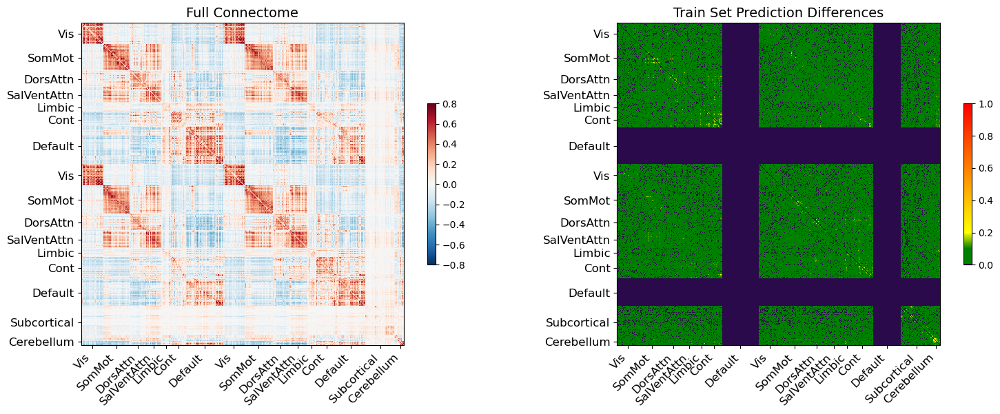

<Figure size 640x480 with 0 Axes>

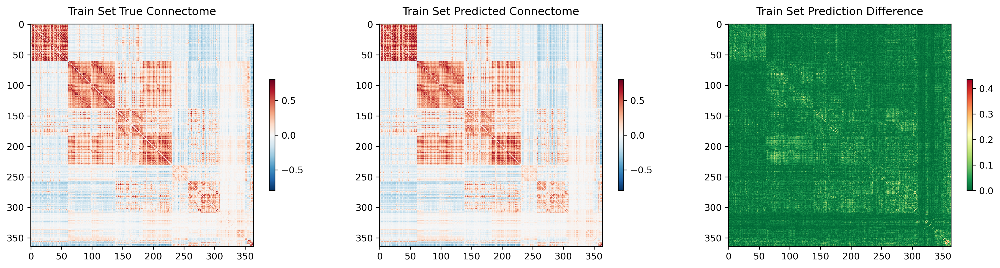

<Figure size 640x480 with 0 Axes>

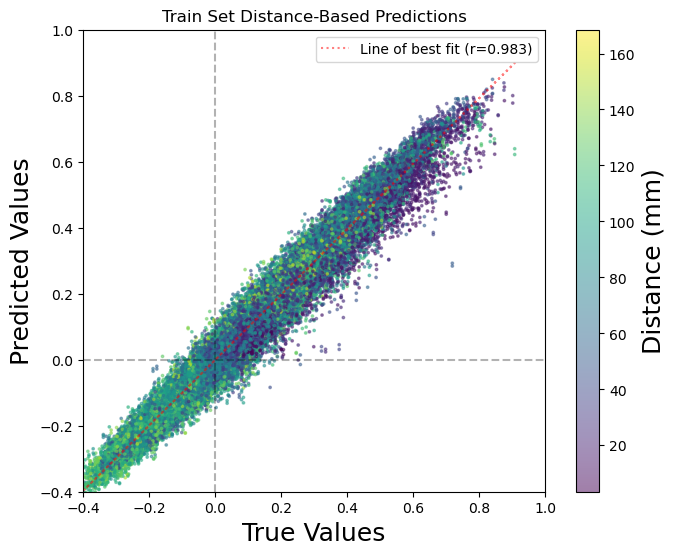

Running test evaluation...

=== TEST EVALUATION ===
Evaluating 91 regions, 8190 connections


<Figure size 640x480 with 0 Axes>

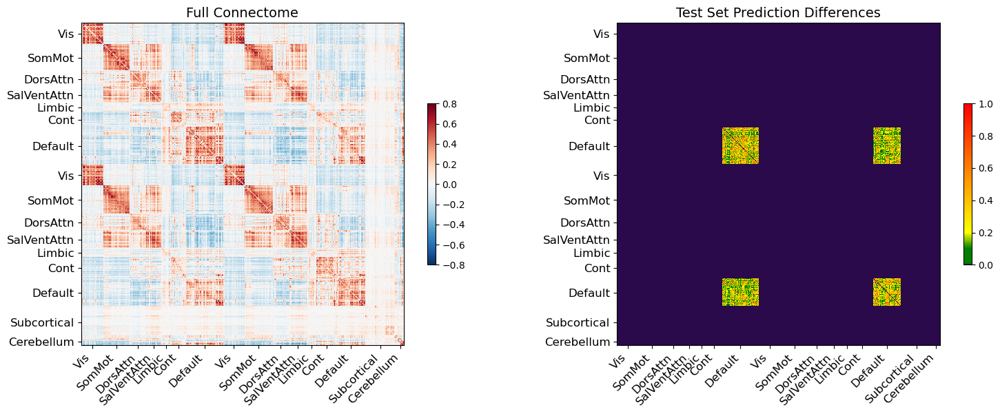

<Figure size 640x480 with 0 Axes>

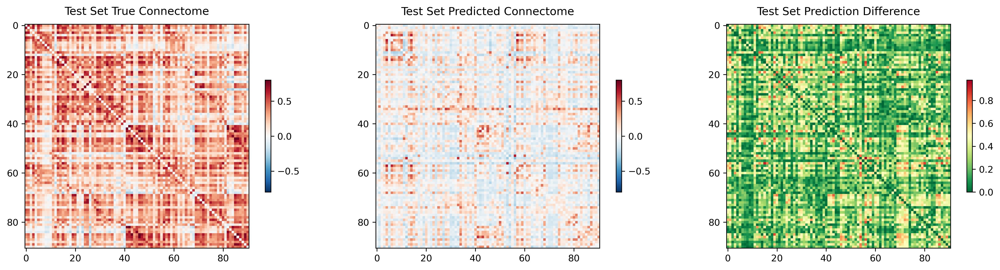

<Figure size 640x480 with 0 Axes>

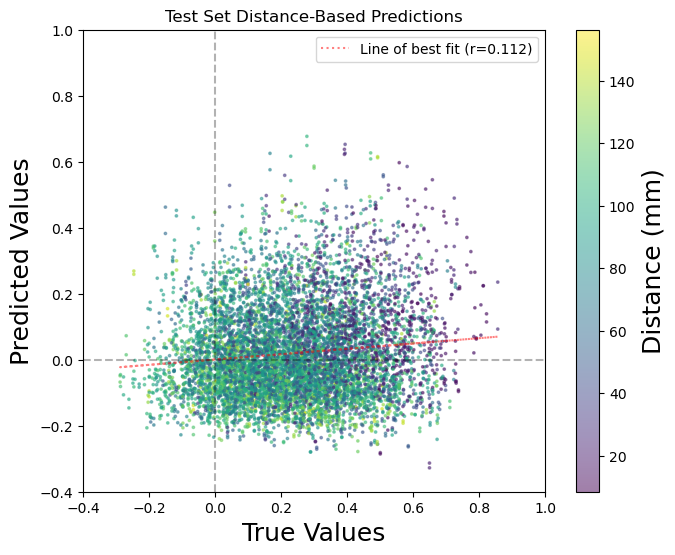

TRAIN METRICS
GLOBAL: mse=0.001101, mae=0.023934, r2=0.9655, pearson_r=0.9830, spearman_r=0.9762, geodesic_distance=15.9603
DISTANCE-BASED: short=0.9824, mid=0.9815, long=0.9770
HEMISPHERIC: left=0.9802, right=0.9844, inter=0.9861
CONNECTION STRENGTH: neg=0.6503, weak=0.9693, pos=0.8902
NETWORK CORRELATIONS:
  NETWORK      INTRA      INTER
  ------------------------------
  Cont          0.9871    0.9890
  SalVentAttn    0.9858    0.9879
  Limbic        0.9848    0.9889
  DorsAttn      0.9915    0.9895
  SomMot        0.9890    0.9892
  Vis           0.9923    0.9910
  Subcortical    0.9834    0.9884
  Cerebellum    0.9754    0.9884

TEST METRICS
GLOBAL: mse=0.102947, mae=0.262933, r2=-1.6269, pearson_r=0.1119, spearman_r=0.0905, geodesic_distance=13.0109
DISTANCE-BASED: short=0.1699, mid=0.0386, long=-0.0325
HEMISPHERIC: left=0.1738, right=0.0680, inter=0.0925
CONNECTION STRENGTH: weak=0.0486, pos=0.0839
NETWORK CORRELATIONS:
  NETWORK      INTRA      INTER
  -------------------------

best_val_loss,▁
test_mse_loss,▃▃▅▄▄▅▃▂▁▂▆▄▆▃█▄▄█▅▄▂▁▄▄▃▅▄▃▃▄▃▂▅▅▄▄▄▅▄▄
train_mse_loss,█▄▄▃▃▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
best_val_loss,0.13306
test_mse_loss,0.10296
train_mse_loss,0.00189


Final evaluation metrics logged successfully.


wandb: WARNING Malformed sweep config detected! This may cause your sweep to behave in unexpected ways.
wandb: WARNING To avoid this, please fix the sweep config schema violations below:
wandb: WARNING   Violation 1. Additional properties are not allowed ('best_parameters' was unexpected)


Create sweep with ID: 0srz302l
Sweep URL: https://wandb.ai/alexander-ratzan-new-york-university/gx2conn/sweeps/0srz302l
Initialized sweep with ID: 0srz302l
Testing network: Subcortical
Vis
SomMot
DorsAttn
SalVentAttn
Limbic
Cont
Default
Cerebellum


wandb: Agent Starting Run: m2vzoztg with config:
wandb: 	batch_size: 512
wandb: 	binarize: False
wandb: 	dropout_rate: 0.1
wandb: 	epochs: 75
wandb: 	hidden_dims: [256, 128]
wandb: 	input_dim: 14760
wandb: 	learning_rate: 9e-05
wandb: 	weight_decay: 0.0001
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


Processing inner fold 0


/ext3/miniconda3/lib/python3.11/site-packages/torch/optim/lr_scheduler.py:60: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(


Number of learnable parameters in MLP: 3812609
Using device: cuda
GPU 0: NVIDIA H100 80GB HBM3 - Memory Allocated: 0.34 GB
Best val loss so far at epoch 1: 0.1959
Best val loss so far at epoch 2: 0.1642
Best val loss so far at epoch 4: 0.1628
Best val loss so far at epoch 5: 0.1437
Epoch 5/75, Train Loss: 0.0543, Val Loss: 0.1437, Time: 2.66s
Best val loss so far at epoch 6: 0.1271
Best val loss so far at epoch 8: 0.0733
Epoch 10/75, Train Loss: 0.0310, Val Loss: 0.1120, Time: 2.88s
Best val loss so far at epoch 11: 0.0675
Epoch 15/75, Train Loss: 0.0195, Val Loss: 0.1202, Time: 2.81s
Epoch 20/75, Train Loss: 0.0141, Val Loss: 0.1439, Time: 2.50s
Epoch 25/75, Train Loss: 0.0111, Val Loss: 0.1866, Time: 2.78s
Epoch 30/75, Train Loss: 0.0094, Val Loss: 0.1551, Time: 2.90s

LR REDUCED: 0.000090 → 0.000027 at Val Loss: 0.170780
Epoch 35/75, Train Loss: 0.0068, Val Loss: 0.1227, Time: 2.58s


wandb: Ctrl + C detected. Stopping sweep.


KeyboardInterrupt: 

<Figure size 640x480 with 0 Axes>

In [9]:
single_sim_run(
              feature_type=[{'transcriptome': None}],
              train_shared_regions=False,
              test_shared_regions=True,
              omit_subcortical=False,
              dataset='UKBB',
              parcellation='S456',
              hemisphere='both',
              connectome_target='FC',
              binarize=False,
              impute_strategy='mirror_interpolate',
              sort_genes='refgenome',
              gene_list='0.2',
              cv_type='schaefer',
              random_seed=42,
              search_method=('wandb', 'mse', 3),
              track_wandb=True,
              skip_cv=False,
              model_type='dynamic_mlp',
              use_gpu=True, 
              null_model='spin',
              use_folds=[4, 5, 6, 7]
              )

# Clear GPU memory
if torch.cuda.is_available():
    torch.cuda.empty_cache()

# Clear CPU memory
gc.collect()